## Import libraries


In [ ]:
from google.colab import files
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import datetime
import cv2
import imutils
from google.colab.patches import cv2_imshow


# Data preparation

In [ ]:
# We want to unzip the dataset into /content/data folder
!unzip -q UTKFace.zip -d data

replace data/__MACOSX/._UTKFace? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
# Here we preprocess the datasets and get (image, age) pairs

MODEL_INPUT_IMAGE_SIZE = [200, 200]
TRAIN_TEST_SPLIT = 0.3
N = 20000 # Number of samples to take from dataset
image_dir = "data/UTKFace"

def parse_image(filename):
    # one example of filename: 116_1_2_20170112220255503.jpg.chip.jpg 
    # 116 is age and this number ranges from 0-116

    image_raw = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_raw, channels=3)

    # Resize the image and normalize the value from [0, 255] to [0, 1]

    image = tf.image.resize(image, tf.constant([200, 200])) 
    image /= 255 
    print(image.shape)

    # Process filename to get the age
    # Convert the age from string to dtype float32 
    # Normalize the age from [0, 116] to [0, 1]
    img_name = tf.strings.split(filename, '/')[2]
    parts = tf.strings.split(img_name, '_')
    age = tf.strings.to_number(parts[0]) / 116

    return image, age

# List all the image files in the given directory.
list_ds = tf.data.Dataset.list_files(image_dir + "/*.jpg.chip.jpg")

# Map parse_image method to all filenames.
dataset = list_ds.map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.take(N)

(200, 200, 3)


In [ ]:
# Create train and test splits of the dataset.
num_examples_in_test_ds = int(N * TRAIN_TEST_SPLIT)

test_ds = dataset.take(num_examples_in_test_ds)
train_ds = dataset.skip(num_examples_in_test_ds)

print('Num examples in train ds {}'.format(train_ds.cardinality()))
print('Num examples in test ds {}'.format(test_ds.cardinality()))


Num examples in train ds 14000
Num examples in test ds 6000


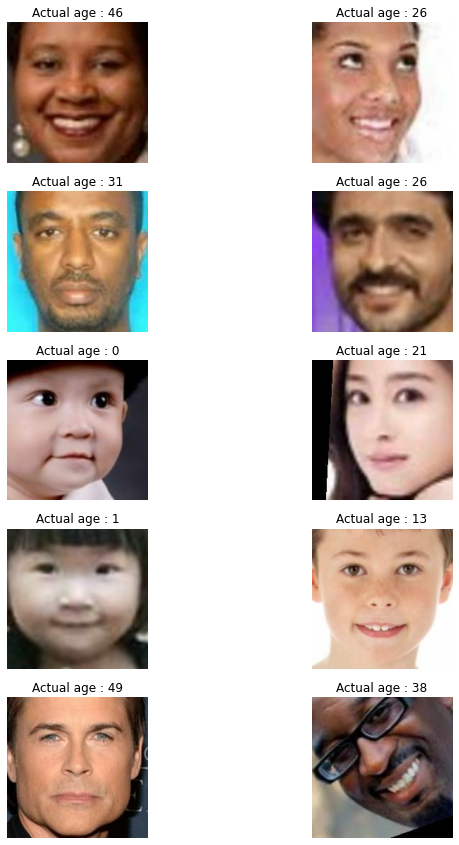

In [ ]:
# change
# Visualize the datasets
fig = plt.figure(figsize=(10, 15))
rows = 5
columns = 2

i = 1
for image, actual_age in test_ds.take(10):
    fig.add_subplot(rows, columns, i)
    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title('Actual age : {}'.format(int(actual_age.numpy() * 116)))
    i += 1

# Model architecture

Please use a pen and paper and draw out the entire model architecture based on the code below

In [ ]:
# Negative slope coefficient for LeakyReLU.
leaky_relu_alpha = 0.2

lite_model = False

def conv(x, num_filters, kernel_size=(3, 3), strides=1):
    x = tf.keras.layers.Conv2D(
          num_filters,
          kernel_size=kernel_size,
          strides=strides,
          use_bias=False,
          kernel_initializer=tf.keras.initializers.HeNormal(),
          kernel_regularizer=tf.keras.regularizers.L2(1e-5),
        )(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(leaky_relu_alpha)(x)
    return x

def dense(x, filters, dropout_rate):
    x = tf.keras.layers.Dense(
          filters, 
          kernel_regularizer=tf.keras.regularizers.L2(0.1), 
          bias_regularizer=tf.keras.regularizers.L2(0.1)
        )(x)
    x = tf.keras.layers.LeakyReLU(alpha=leaky_relu_alpha)(x)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    return x



In [ ]:
# 1. Init a Input Layer.
inputs = tf.keras.layers.Input(shape=(200, 200, 3))

# 2. Define the conv blocks sequentially
# Number of convolution layers to be added.
num_blocks = 6
# Num filters for each conv layer.
num_filters = [16, 32, 64, 128, 256, 256]
# Kernel sizes for each conv layer.
kernel_sizes = [3, 3, 3, 3, 3, 3]

x = inputs
for i in range(num_blocks):
    x = conv(x, num_filters[i], kernel_size = kernel_sizes[i])
    x = tf.keras.layers.MaxPooling2D()(x)

# 3. Flatten the output of the last Conv layer.
x = tf.keras.layers.Flatten()(x)
conv_output = x 

# 4. Add fully connected layers
x = dense(conv_output, 256, 0.6)
x = dense(x, 64, 0.4)
x = dense(x, 32, 0.2)
outputs = tf.keras.layers.Dense(1)(x)

# 5. Build the Model
model = tf.keras.models.Model(inputs, outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 198, 198, 16)      432       
                                                                 
 batch_normalization (BatchN  (None, 198, 198, 16)     64        
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 198, 198, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 32)        4608  

# Model training

In [ ]:
learning_rate = 0.001
num_epochs = 50
batch_size = 128
batch_train_ds = train_ds.batch(batch_size)
batch_test_ds = test_ds.batch(batch_size)

In [ ]:
# Define a few handy callbacks

# Init model checkpoint callback
save_dir_ = 'model_age'
save_dir = save_dir_ + '/{epoch:02d}-{val_mae:.2f}.h5'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( 
    save_dir, 
    save_best_only=True, 
    monitor='val_mae', 
    mode='min',
)

tb_log_name = 'model_age'

# Init tensorBoard

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")

# Init learning rate scheduler
# Define a function that return a decayed learning rate based on epochs
# The idea is that 
# - 0.001 is the initial learning rate
# - after 25% epoches, we want to decrease the learning rate. For example, learning_rate/2
# - after 50% epoches, learning rate could be even smaller
# - after 75% epoches, it should drop again
# Why do we need to do this?
def scheduler(epochs, learning_rate):
  if epochs > num_epochs * 0.25:
    return learning_rate / 2
  elif epochs > num_epochs * 0.5:
    return learning_rate / 4
  elif epochs > num_epochs * 0.75:
    return learning_rate / 8
  return learning_rate

lr_schedule_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

# Init early stopping callback
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=10)

# Compile the model
model.compile(
    loss=tf.keras.losses.mean_absolute_error,
    optimizer = tf.keras.optimizers.Adam(learning_rate), 
    metrics=['mae']
)


In [ ]:
# When the model starts training, you can hit the refresh button and track the progress
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

If you don't want to train the model every time. Please download your latest checkpoint, and manually upload it next time. Therefore, you may skip the model training section next time.

In [ ]:
model.fit( 
    batch_train_ds, 
    epochs=num_epochs,  
    validation_data=batch_test_ds, 
    callbacks=[checkpoint_callback, tensorboard_callback, lr_schedule_callback, early_stopping_callback]
)

Epoch 1/50
110/110 [==============================] - 44s 279ms/step - loss: 15.5050 - mae: 0.2682 - val_loss: 3.0162 - val_mae: 0.1436 - lr: 0.0010
Epoch 2/50
110/110 [==============================] - 32s 266ms/step - loss: 1.2258 - mae: 0.1072 - val_loss: 0.4749 - val_mae: 0.1327 - lr: 0.0010
Epoch 3/50
110/110 [==============================] - 32s 268ms/step - loss: 0.2771 - mae: 0.1003 - val_loss: 0.2131 - val_mae: 0.1282 - lr: 0.0010
Epoch 4/50
110/110 [==============================] - 32s 268ms/step - loss: 0.1548 - mae: 0.0952 - val_loss: 0.1511 - val_mae: 0.1051 - lr: 0.0010
Epoch 5/50
110/110 [==============================] - 32s 264ms/step - loss: 0.1317 - mae: 0.0892 - val_loss: 0.1293 - val_mae: 0.0882 - lr: 0.0010
Epoch 6/50
110/110 [==============================] - 32s 266ms/step - loss: 0.1241 - mae: 0.0844 - val_loss: 0.1215 - val_mae: 0.0825 - lr: 0.0010
Epoch 7/50
110/110 [==============================] - 32s 267ms/step - loss: 0.1177 - mae: 0.0789 - val_loss: 0

# Model evaluation and visualization

Please rerun the data preparation section if you skipped the model training

In [ ]:

# Save the entire model as a SavedModel.
!mkdir -p saved_model
model.save('my_model')

In [ ]:
# Specify your own trained model path below
model_path = 'my_model'
model = tf.keras.models.load_model(model_path)

In [ ]:
solution = {i: 0 for i in range(11)}
for image, actual_age in test_ds:
    predicted_age = model.predict([image[tf.newaxis, :]])
    error = int(tf.math.round(abs(predicted_age - actual_age) * 116))
    print(error)
    if error in solution:
      solution[error] += 1
print(solution)

串流輸出內容已截斷至最後 5000 行。
8
1/1 [==============================] - 0s 21ms/step
5
1/1 [==============================] - 0s 22ms/step
1
1/1 [==============================] - 0s 31ms/step
6
1/1 [==============================] - 0s 25ms/step
3
1/1 [==============================] - 0s 22ms/step
12
1/1 [==============================] - 0s 29ms/step
20
1/1 [==============================] - 0s 19ms/step
6
1/1 [==============================] - 0s 22ms/step
0
1/1 [==============================] - 0s 20ms/step
1
1/1 [==============================] - 0s 20ms/step
4
1/1 [==============================] - 0s 19ms/step
6
1/1 [==============================] - 0s 20ms/step
1
1/1 [==============================] - 0s 23ms/step
0
1/1 [==============================] - 0s 21ms/step
2
1/1 [==============================] - 0s 23ms/step
3
1/1 [==============================] - 0s 19ms/step
3
1/1 [==============================] - 0s 22ms/step
1
1/1 [==============================] - 0s 26ms/step
2
1/1

In [ ]:
accuracy = sum([solution[error] for error in solution]) / int(test_ds.cardinality())
acc = sum([solution[error] for error in solution if error <= 5]) / int(test_ds.cardinality())
print(accuracy, acc)

0.8541666666666666 0.6433333333333333


1/1 [==============================] - 0s 24ms/step


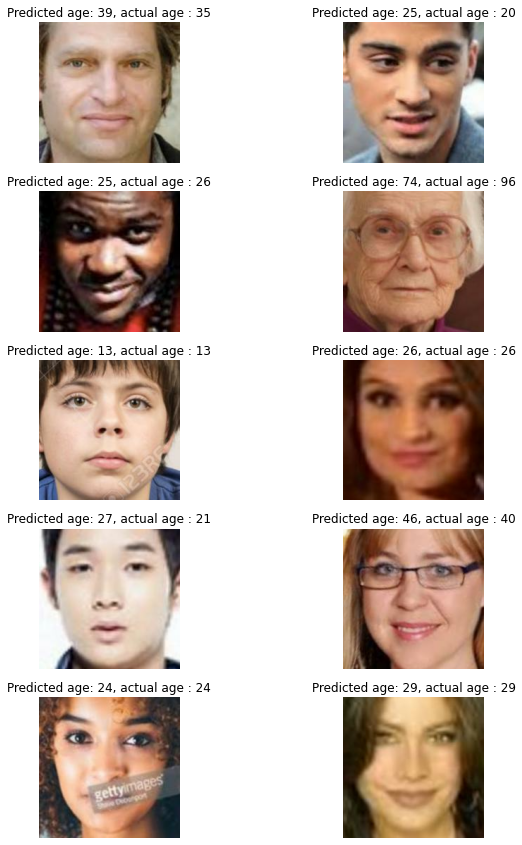

In [ ]:
# change
# Visualize the datasets
fig = plt.figure(figsize=(10, 15))
rows = 5
columns = 2
i = 1
for image, actual_age in test_ds.take(10):
    predicted_age = model.predict([image[tf.newaxis, :]])
    fig.add_subplot(rows, columns, i)
    plt.imshow(image.numpy())
    plt.axis('off')
    plt.title('Predicted age: {}, actual age : {}'.format(int(predicted_age[0][0] * 116), int(actual_age.numpy() * 116)))
    i += 1

# Model inference on real life images

### Face recognition using OpenCV

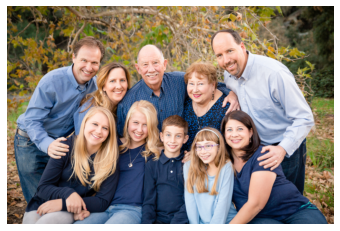

In [ ]:
# Read image
img = cv2.imread("family.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Resize it to have a maximum width of 1000 pixels
img = imutils.resize(img, width=1000)
plt.axis("off")
plt.imshow(img)

In [ ]:
# Opencv supports object detection, so we can easily detect human faces using the pretrained weights

# Download the pretrained model config and weights
!wget -N https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt
!wget -N https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel

# Run face detection on the image
prototxt = 'deploy.prototxt'
model_name = 'res10_300x300_ssd_iter_140000.caffemodel'
net = cv2.dnn.readNetFromCaffe(prototxt, model_name)
blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
net.setInput(blob)
detections = net.forward()

--2022-01-16 18:19:16--  https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28104 (27K) [text/plain]
Saving to: ‘deploy.prototxt’

deploy.prototxt     100%[===================>]  27.45K  --.-KB/s    in 0s      

Last-modified header missing -- time-stamps turned off.
2022-01-16 18:19:16 (155 MB/s) - ‘deploy.prototxt’ saved [28104/28104]

--2022-01-16 18:19:16--  https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubuse

In [ ]:
# change
# We want to draw the bounding boxes on the images so we have a better idea of how it works
detected_img = img.copy()
(h, w) = detected_img.shape[:2]
for i in range(0, detections.shape[2]):
  confidence = detections[0, 0, i, 2]
  if confidence > 0.4:
    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
    (startX, startY, endX, endY) = box.astype("int")
    text = "{:.1f}%".format(confidence * 100)
    y = startY - 5 if startY - 5 > 5 else startY + 5
    cv2.rectangle(detected_img, (startX, startY), (endX, endY), (0, 255, 255) ,2)
    cv2.putText(detected_img, text, (startX, startY), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)

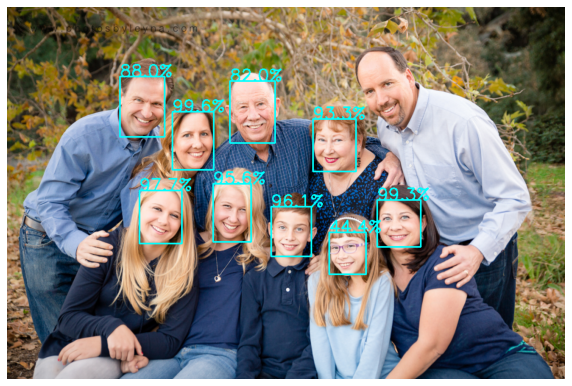

In [ ]:
plt.figure(figsize=(10,10))
plt.axis("off")
plt.imshow(detected_img)

### Age model inference on detected faces

In [ ]:
# Crop faces and run model inference on them
predicted_img = img.copy()
(h, w) = predicted_img.shape[:2]
for i in range(0, detections.shape[2]):
  # change
  confidence = detections[0, 0, i, 2]
  if confidence > 0.4:
    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
    (startX, startY, endX, endY) = box.astype("int")
    y = startY - 5 if startY - 5 > 5 else startY + 5
    cv2.rectangle(predicted_img, (startX, startY), (endX, endY), (0, 255, 255) ,2)

    # Crop the image given startY, startX, endY, endX. Don't forget to normalize the image!
    startY = max(startY - 20, 0)
    startX = max(startX - 20, 0)
    endY = min(endY + 20, h)
    endX = min(endX + 20, w)
    crop_img = cv2.resize(img[startY:endY, startX:endX], (200, 200))

    # Run model inference on the cropped image
    # normalize crop_img
    crop_img = crop_img / 255
    prediction = int(model.predict([crop_img[np.newaxis, :]])[0][0] * 116)
    print()
    text = f"Age:{prediction}"
    cv2.putText(predicted_img, text, (startX, startY), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)


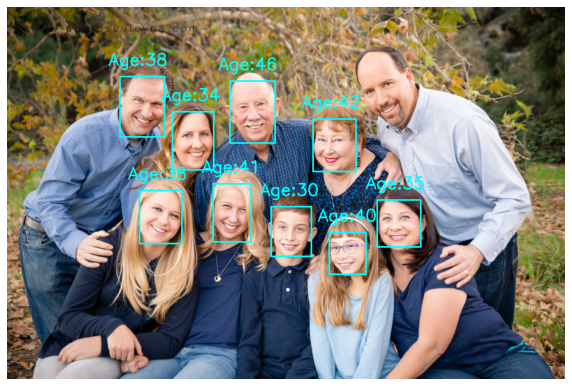

In [ ]:
plt.figure(figsize=(10,10))
plt.axis("off")
plt.imshow(predicted_img)

# Future work

Once we are able to run model inference on a single image and predict ages for all detected faces. We could extend our idea further into offline or real-time videos.

How can we do that?
- If it is offline videos, you can basically split it into many frames, and process each frame like what you did above
- If it is real-time video, the problem would become more complicated. There are many people who have done this in different ways. Here is one example: https://realpython.com/face-detection-in-python-using-a-webcam/


Please use your imagination and extend your face age model into something more interesting!